<a href="https://colab.research.google.com/github/aljaroudi/MaskDetector/blob/main/MaskDetector.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Context

This project aims to detect whether a person is wearing a mask using a small single-board computer and computer vision. One may break down this problem into the following:

1.   Understaing the concepts of computer vision
2.   How to set up an object detection system
3.   Training a YOLO object detection model
4.   Detection

On Google Colab, you may use the table of contents on the left to navigate through this notebook. The resulting model files and detected images are ***temporarily*** stored in Google Colab and are deleted once the Google Colab session ends.

To run all the commands, from the *Runtime* dropdown on the top, click on *Run All*

# Keywords

*   **GPU**

    A graphics computing unit is a processing unit that is designed specifically for parallel computing and, therefore, is significantly superior to CPUs when it comes to processing images and/or videos.


*   **Frame**

    A video is composed of an array of frames; each frame is a single image. A typical video may have from 24 to 30 frames for every second. 


*   **FPS**

    Frames per second.


*   **mAP**

    Mean average precision.


*   **CUDA**

    Developed by NVIDIA, "CUDA® is a parallel computing platform and programming model" that is made for developers to better take advantage of NVIDIA's powerful GPUs. [[1](https://colab.research.google.com/drive/1JLnST14eQOnbOhDVT7UG8EuXuVt-qyqa?authuser=1#scrollTo=u-sHO4N18iX5)]


*   **OpenCV**

    OpenCV, where CV stands for **c**omputer **v**ision, is a computer vision library written mainly in C++, with APIs available in other languages such as Python for easier development and more access.


*   **YOLO**

    YOLO is a real-time object detection system which stands for **Y**ou **O**nly **L**ook **O**nce.


*   **Training**

    Feeding an AI model enough data, such as images or numeric values, for it to recognize what is common amongst all of them, aka the pattern.

# Computer Vision Applications
Computer vision is a superset of numerous techniques, including object detection, object recognition, object tracking, and more, each of which has unique purpose.

<!-- ![Comparison 1](https://406167-1278791-raikfcquaxqncofqfm.stackpathdns.com/wp-content/uploads/2021/03/classification.jpg) -->
![Comparison 2](https://miro.medium.com/max/1600/1*SNvD04dEFIDwNAqSXLQC_g.jpeg)

## Object Tracking
Tracks the movement of an object from a frame to another frame. Example: tracking a ball in a soccer game.

## Image Classification

Assigns a set of labels that best describe the overall image. Example: a picture of a lion may be assigned the labels: lion, cat, animal. It is worth mentioning that classification alone does not provide information regarding where the classified object is located.

## Object Localization

Object Localization is often used to complement Image Classification's lack of localizing the classified objects.

## Object Detection

Object detection combines Image Classification and Object Localization.

## Semantic Segmentation

On the pixel level, Semantic Segmentation helps distinguish between different objects. In other words, for any given pixel in an image, Semantic Segmentation assigns a certain label. However, it can not count the objects or differentiate between multiple instances of the same object.

## Instance Segmentation

Just like Object Localization helps make Image Classification more useful, Instance Setgmentation goes beyond what Semantic Segmentation does by providing the ability to tell apart different instances of a certain object.

# Setup

## Install packages

In [ ]:
# Skip terminal output
# %%capture

# Built-in: clears terminal output programmatically
from IPython.display import clear_output
# Built-in: displays images
from IPython.display import Image as display_img

# wandb helps install YOLOv5 weights
!pip install pyyaml

# Clone YOLOv5 from GitHub
!git clone https://github.com/ultralytics/yolov5.git

Defaulting to user installation because normal site-packages is not writeable
Cloning into 'yolov5'...
remote: Enumerating objects: 7328, done.
remote: Total 7328 (delta 0), reused 0 (delta 0), pack-reused 7328
Receiving objects: 100% (7328/7328), 8.92 MiB | 6.19 MiB/s, done.
Resolving deltas: 100% (5049/5049), done.


## Test YOLOv5



/home/mochi/Documents/Jupyter/MaskDetector/yolov5
detect: weights=['yolov5x.pt'], source=data/images, imgsz=640, conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False
YOLOv5 🚀 v5.0-231-g03281f8 torch 1.9.0+cu111 CUDA:0 (NVIDIA Graphics Device, 12050.6875MB)

100%|████████████████████████████████████████| 168M/168M [00:09<00:00, 17.7MB/s]

Fusing layers... 
/home/mochi/.local/lib/python3.9/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, pa

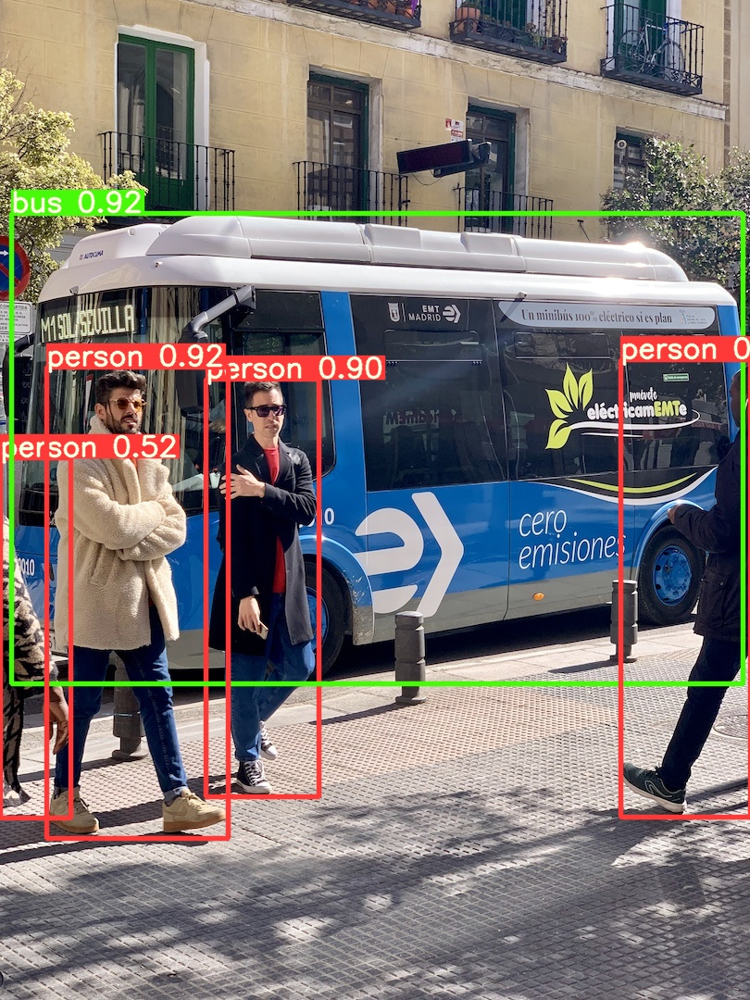

In [ ]:
# Make sure YOLO works
%cd yolov5
!python3 detect.py --weights yolov5x.pt \
                  --img 640 \
                  --conf 0.25 \
                  --source data/images

display_img('runs/detect/exp/bus.jpg')

# Train a YOLO model

## Download the dataset

In [ ]:
# Download the dataset from Roboflow.com into the parent folder of yolov5/
# Note this link is temporary and will be invalid in 30 days.
%cd ..
!curl -L "https://app.roboflow.com/ds/SYZgVNYcZ9?key=TX4ujs4csN" > roboflow.zip; unzip -q roboflow.zip; rm roboflow.zip


/home/mochi/Documents/Jupyter/MaskDetector
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0    680      0  0:00:01  0:00:01 --:--:--   680
100  118M  100  118M    0     0  12.3M      0  0:00:09  0:00:09 --:--:-- 17.9M


## Construct a .yaml file

In [ ]:
# Read data.yaml data and display it
from yaml import safe_load

with open('data.yaml', 'r') as file:
  num_classes = str(safe_load(file)['nc'])

%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['mask_weared_incorrect', 'with_mask', 'without_mask']

In [ ]:
# Write another .yaml file for YOLOv5

# Set iPython to write a file with variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def write_template(line, cell):
  with open(line, 'w') as file:
    file.write(cell.format(**globals()))

In [ ]:
%%write_template yolov5/models/my_yolo.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

## Training Parameters


*   **`img`**
    
  Image size is 416 by 416 pixels. This is set according to the model, which is YOLOv5 in this case.
*   **`batch`**

  The number of images cached into the GPU. This is set according to how much memory (VRAM) the GPU has. Since Google Colab provided NVIDIA Tesla V100 to me, my limit is 16 GB.

*   **`epochs`**

  The number of times the training will run. A general rule of thumb is to set it to 1000x the number of classes for object detection. *I set it to 650, however, because given the previous results, the mAP does not improve at all after 650.*

*   **`data`**

  A path to a .yaml file that tells the nubmer of classes and their names.

*   **`name`**

  The name of the resulting file.

## Train!

In [ ]:
%%time
%cd yolov5

# Begin training!
!python3 train.py --img 416 --batch 64 --epochs 650 --data '../data.yaml' --cfg ./models/my_yolo.yaml --weights '' --name yolov5s_results  --cache

[Errno 2] No such file or directory: 'yolov5'
/home/mochi/Documents/Jupyter/MaskDetector/yolov5
train: weights=, cfg=./models/my_yolo.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=650, batch_size=64, img_size=[416], rect=False, resume=False, nosave=False, notest=False, noautoanchor=False, evolve=False, bucket=, cache_images=True, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, entity=None, name=yolov5s_results, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias=latest, local_rank=-1
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v5.0-231-g03281f8 torch 1.9.0+cu111 CUDA:0 (NVIDIA Graphics Device, 12050.6875MB)

hyperparameters: lr0=0.01, lrf=0.2, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, ob

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

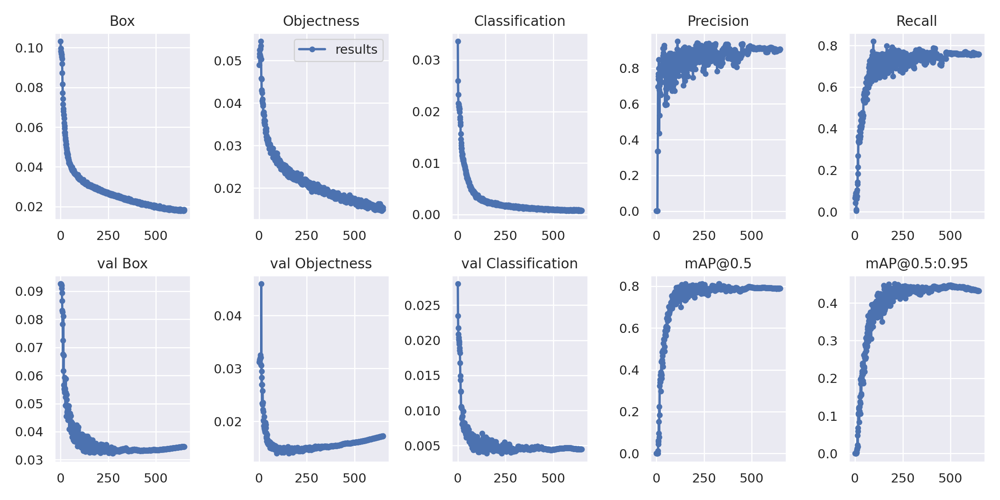

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
display_img(filename='runs/train/yolov5s_results/results.png', width=1000)  # view results.png

# 3. Detection!

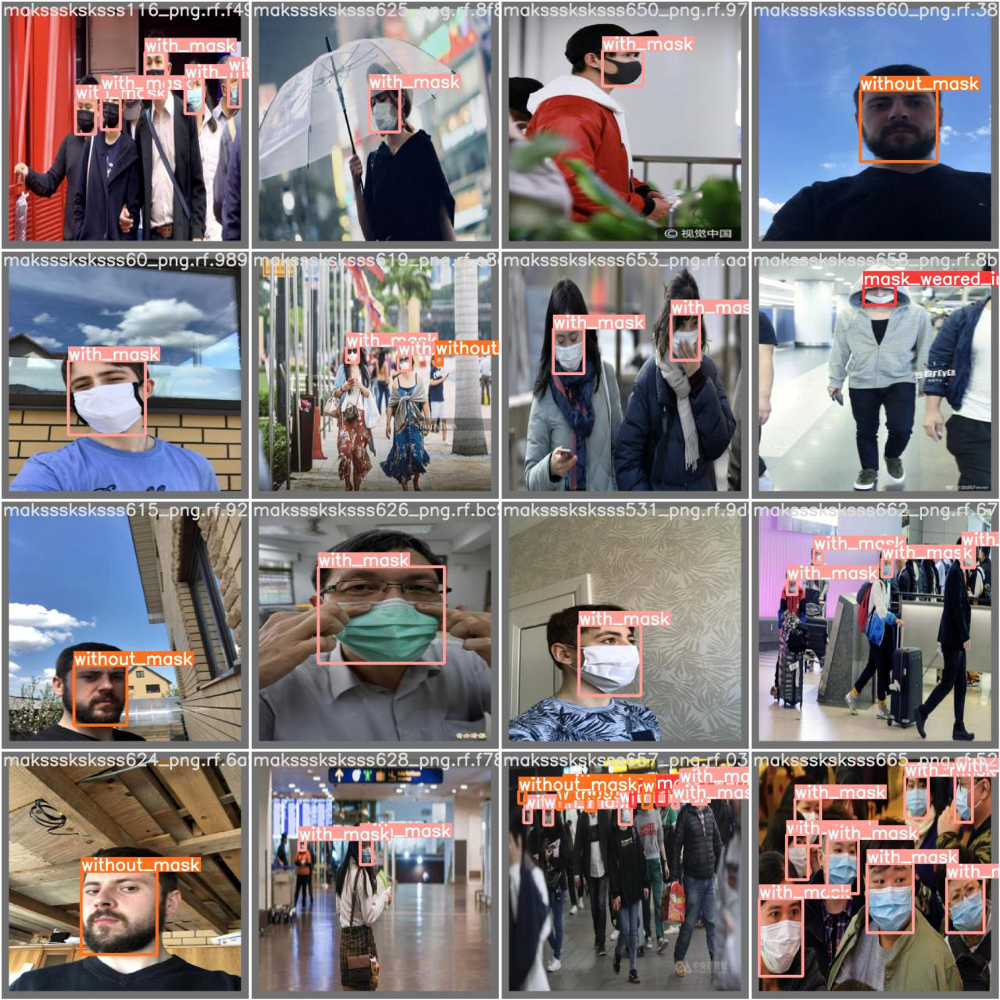

In [ ]:
display_img(filename='runs/train/yolov5s_results/test_batch0_labels.jpg', width=900)